### Imports & Load Data

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import nltk
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

umap_nonsense_embedding = np.load('../data/umap_with_nonsense.npy')
labels_all = np.load('../data/labels_all.npy')
keys_all = np.load('../data/keys_with_nonsense.npy')
tsne = np.load('../data/tsne_with_nonsense')
conc = np.recfromcsv('../data/Concreteness_ratings_Brysbaert_et_al_BRM.csv')

def minmax(array):
    return (array-np.min(array))/(np.max(array)-np.min(array))

garble_axis = minmax(umap_nonsense_embedding[:,0])

### Figure 1

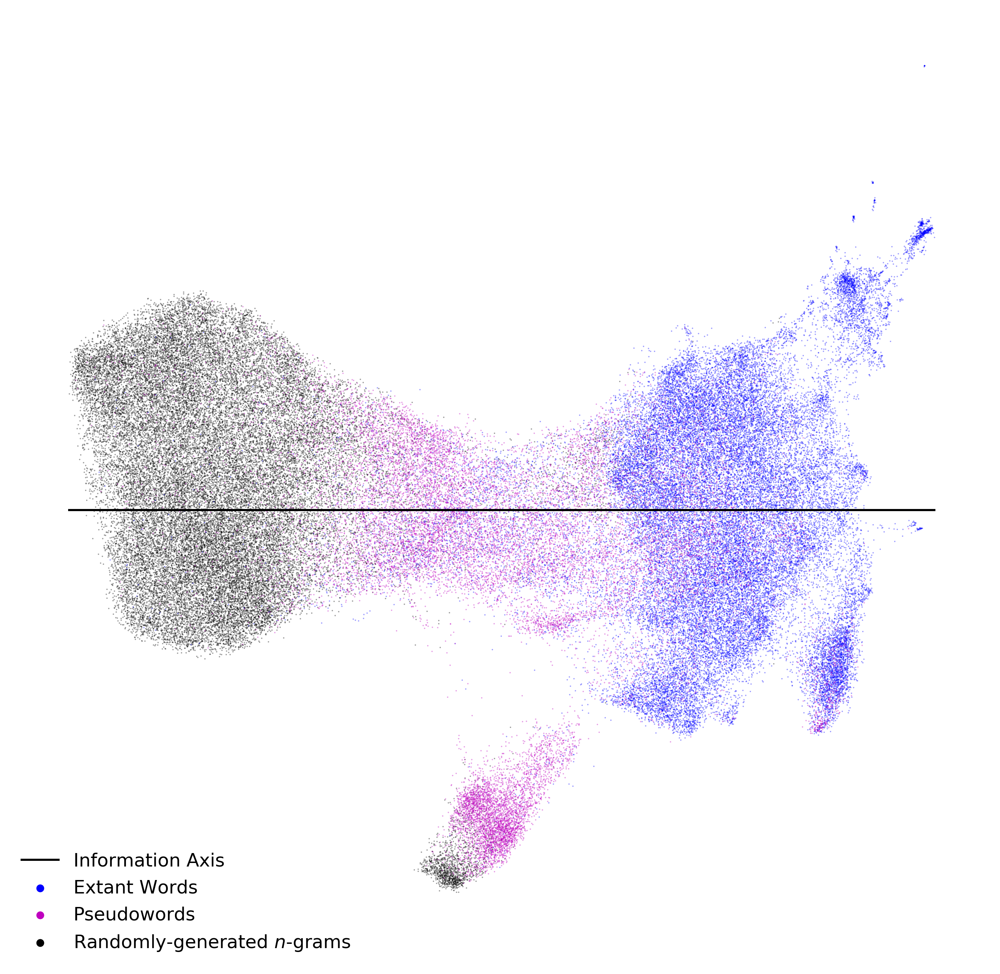

In [16]:
#Note that the UMAP embedding is already oriented along the information axis
plt.figure(figsize=(25,25)) 

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==0],umap_nonsense_embedding[:,1][labels_all==0],
            s=1,marker='o',edgecolor='k',alpha=0.3,facecolor='k')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1],umap_nonsense_embedding[:,1][labels_all==1],
            s=1,marker='o',edgecolor='b',alpha=0.3,facecolor='b')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==2],umap_nonsense_embedding[:,1][labels_all==2],
            s=1,marker='o',edgecolor='m',alpha=0.3,facecolor='m')

plt.plot(np.linspace(np.min(-1.*umap_nonsense_embedding[:,0]),np.max(-1.*umap_nonsense_embedding[:,0]),10),
        np.ones(10)*np.median(umap_nonsense_embedding[:,1]),c='k',lw=3,label='Information Axis')

plt.scatter(99.,99.,marker='o',c='b',s=100,label='Extant Words')
plt.scatter(99.,99.,marker='o',c='m',s=100,label='Pseudowords')
plt.scatter(99.,99.,marker='o',c='k',s=100,label='Randomly-generated $n$-grams')

plt.legend(loc=3,fontsize=26,frameon=False)

plt.xlim(-13,2)
plt.ylim(-6,6)

plt.axis('off')
plt.show()

### Figure 2

/Users/eon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/eon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  after removing the cwd from sys.path.
/Users/eon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  """


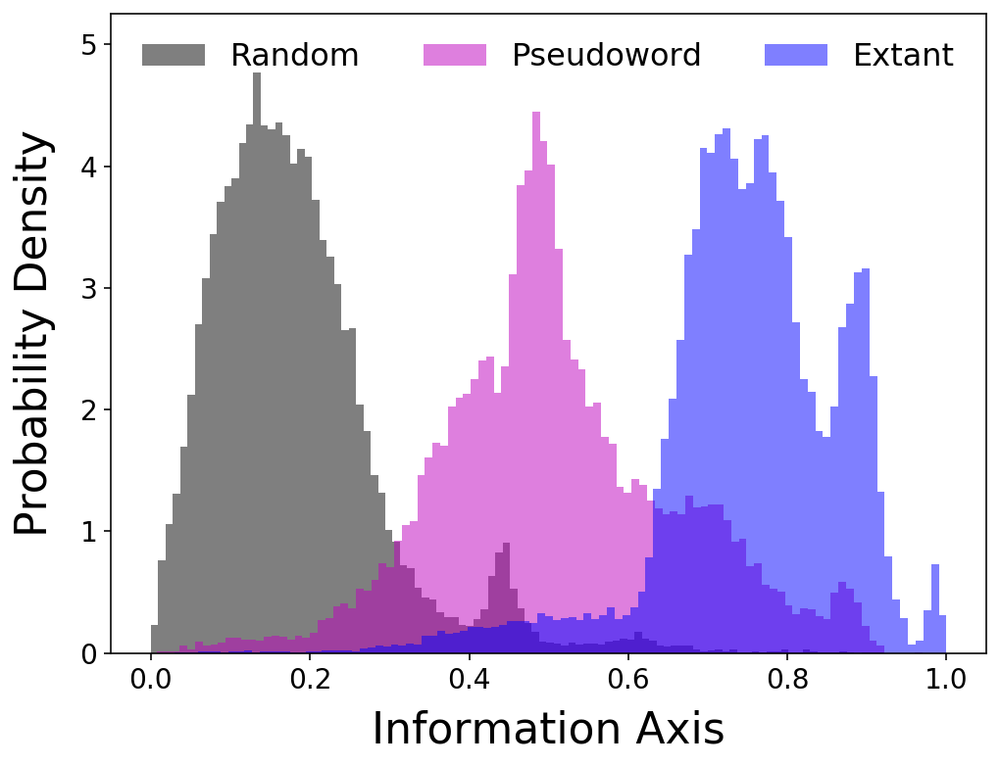

In [18]:
plt.figure(figsize=(8,6))

plt.hist(1.-garble_axis[labels_all==0],histtype='stepfilled',bins=100,
         alpha=0.5,color='k',normed=True,label='Random')
plt.hist(1.-garble_axis[labels_all==2],histtype='stepfilled',bins=100,
         alpha=0.5,color='m',normed=True,label='Pseudoword')
plt.hist(1.-garble_axis[labels_all==1],histtype='stepfilled',bins=100,
         alpha=0.5,color='b',normed=True,label='Extant')

plt.ylim(0,5.25)
plt.xticks([0,0.2,0.4,0.6,0.8,1.0],fontsize=14)
plt.yticks([0,1,2,3,4,5],fontsize=14)

plt.legend(loc='upper center',fontsize=16,ncol=3,frameon=False)
plt.xlabel(r'Information Axis',fontsize=22,labelpad=8)
plt.ylabel(r'Probability Density',fontsize=22,labelpad=12)

plt.show()

### Figure 3

In [19]:
list1=nltk.pos_tag(keys_all[labels_all==1])

noun_bool = np.logical_or(np.array(list1)[:,1]=='NN',np.logical_or(np.array(list1)[:,1]=='NNP',
                                                                   np.array(list1)[:,1]=='NNS'))

adj_bool = np.logical_or(np.array(list1)[:,1]=='JJ',np.logical_or(np.array(list1)[:,1]=='JJR',
                                                                   np.array(list1)[:,1]=='JJS'))

verb_bool1 = np.logical_or(np.array(list1)[:,1]=='VB',np.logical_or(np.array(list1)[:,1]=='VBD',
                                                                   np.array(list1)[:,1]=='VBG'))

verb_bool2 = np.logical_or(np.array(list1)[:,1]=='VBN',np.logical_or(np.array(list1)[:,1]=='VBP',
                                                                   np.array(list1)[:,1]=='VBZ'))

adverb_bool = np.logical_or(np.array(list1)[:,1]=='RB',np.logical_or(np.array(list1)[:,1]=='RBR',
                                                                   np.array(list1)[:,1]=='RBS'))

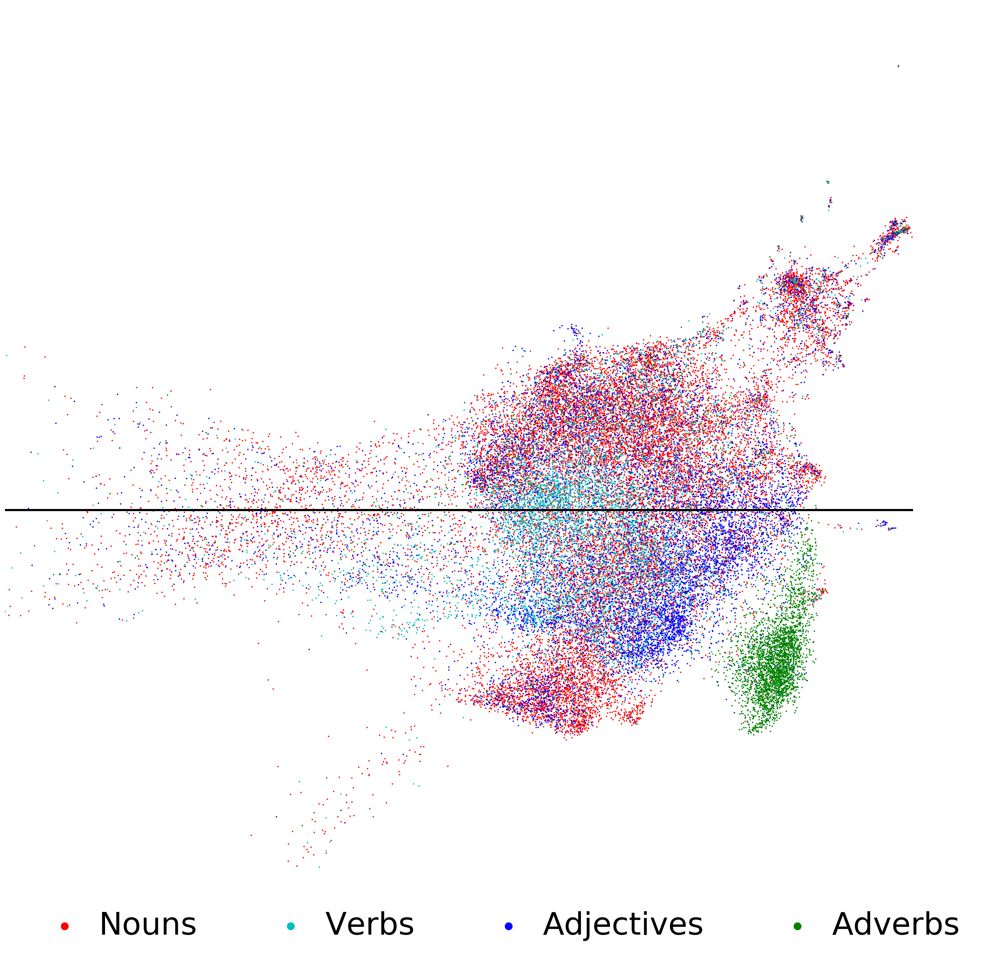

In [21]:
plt.figure(figsize=(25,25)) 

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1][noun_bool],umap_nonsense_embedding[:,1][labels_all==1][noun_bool],
            s=1,marker='o',edgecolor='r',alpha=1.0,facecolor='none')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1][adj_bool],umap_nonsense_embedding[:,1][labels_all==1][adj_bool],
            s=1,marker='o',edgecolor='b',alpha=1.0,facecolor='none')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1][adverb_bool],umap_nonsense_embedding[:,1][labels_all==1][adverb_bool],
            s=1,marker='o',edgecolor='g',alpha=1.0,facecolor='none')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1][np.logical_or(verb_bool1,verb_bool2)],
            umap_nonsense_embedding[:,1][labels_all==1][np.logical_or(verb_bool1,verb_bool2)],
            s=1,marker='o',edgecolor='c',alpha=1.0,facecolor='none')

plt.plot(np.linspace(np.min(-1.*umap_nonsense_embedding[:,0][labels_all==1]),np.max(-1.*umap_nonsense_embedding[:,0][labels_all==1]),10),
        np.ones(10)*np.median(umap_nonsense_embedding[:,1]),c='k',lw=3)

plt.scatter(99.,99.,marker='o',c='r',s=100,label='Nouns')
plt.scatter(99.,99.,marker='o',c='c',s=100,label='Verbs')
plt.scatter(99.,99.,marker='o',c='b',s=100,label='Adjectives')
plt.scatter(99.,99.,marker='o',c='g',s=100,label='Adverbs')

plt.legend(loc=3,fontsize=44,ncol=4,handletextpad=0.1,frameon=False)

plt.xlim(-9,2)
plt.ylim(-6,6)

plt.axis('off')
plt.show()

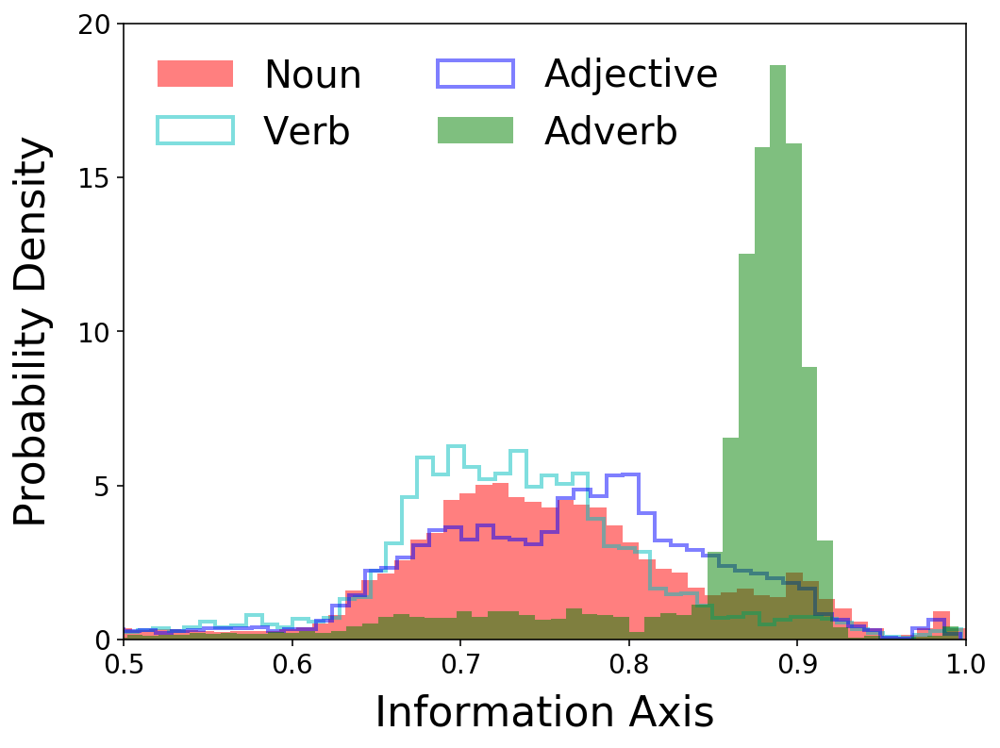

In [24]:
plt.figure(figsize=(8,6))

plt.hist(1.-garble_axis[labels_all==1][noun_bool],histtype='stepfilled',bins=100,alpha=0.5,color='r',density=True,label='Noun')
plt.hist(1.-garble_axis[labels_all==1][np.logical_or(verb_bool1,verb_bool2)],histtype='step',lw=2,bins=100,alpha=0.5,color='c',density=True,label='Verb')
plt.hist(1.-garble_axis[labels_all==1][adj_bool],histtype='step',bins=100,lw=2,alpha=0.5,color='b',density=True,label='Adjective')
plt.hist(1.-garble_axis[labels_all==1][adverb_bool],histtype='stepfilled',bins=100,alpha=0.5,color='g',density=True,label='Adverb')

plt.xlim(0.5,1)
plt.xticks([0.5,0.6,0.7,0.8,0.9,1.0],fontsize=14)
plt.yticks([0,5,10,15,20],fontsize=14)

plt.xlabel(r'Information Axis',fontsize=22,labelpad=8)
plt.ylabel(r'Probability Density',fontsize=22,labelpad=12)
plt.legend(loc=2,fontsize=20,ncol=2,frameon=False)

plt.show()

### Figure 4

In [27]:
conc_strings = []
for i in range(len(conc)):
    conc_strings.append(conc[i]['search_term'].decode("utf-8"))
    
concs = []
concs_sd = []
labels_short = []
axis_concs = []
bools = np.zeros(len(keys_all[labels_all==1]))

for i,key in enumerate(keys_all[labels_all==1]):
    if key in conc_strings:
        bools[i] = 1
        concs.append(conc[conc['search_term']==str.encode(key)]['concm'][0])
        concs_sd.append(conc[conc['search_term']==str.encode(key)]['concsd'][0])
        axis_concs.append(garble_axis[labels_all==1][i])
        labels_short.append(key)
    
concs = np.array(concs)
concs_sd = np.array(concs_sd)
labels_short = np.array(labels_short)
axis_concs = np.array(axis_concs)

/Users/eon/miniconda3/lib/python3.7/site-packages/numpy/lib/npyio.py:2372: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)


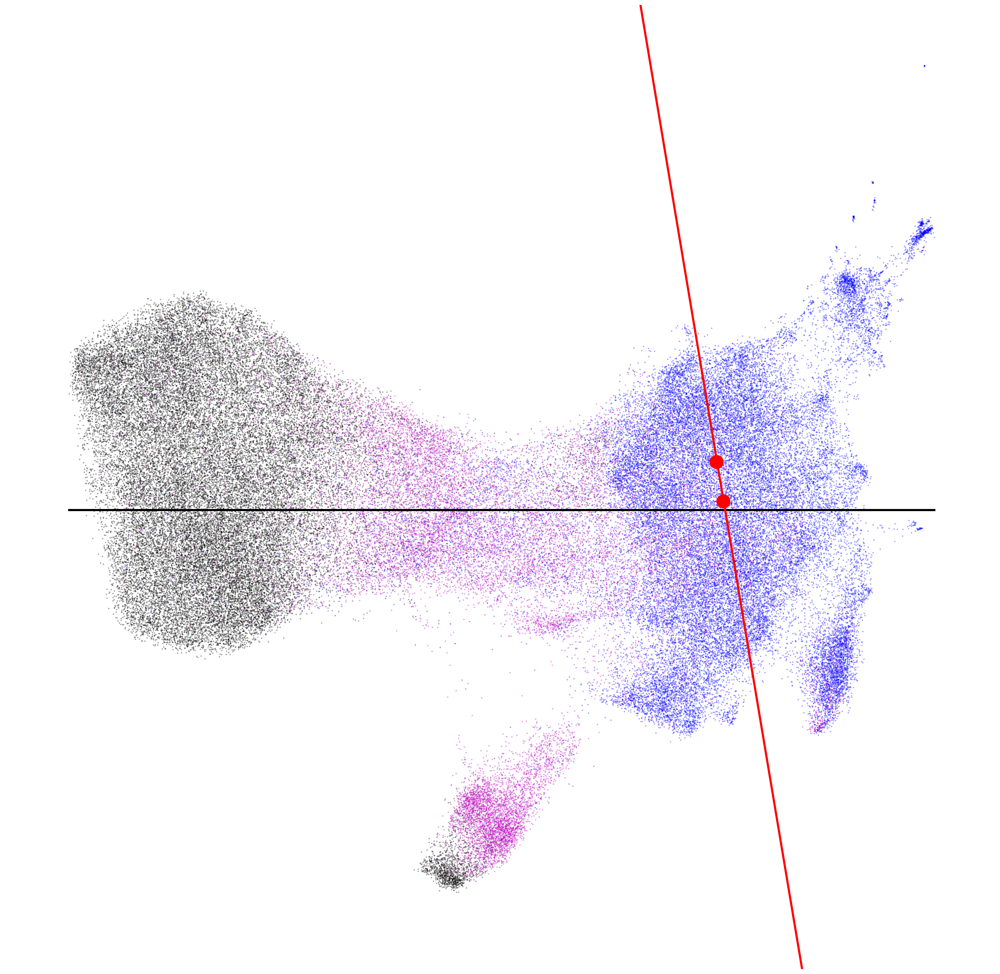

In [25]:
plt.figure(figsize=(25,25)) 

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==0],umap_nonsense_embedding[:,1][labels_all==0],
            s=1,marker='o',edgecolor='k',alpha=0.3,facecolor='k')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1],umap_nonsense_embedding[:,1][labels_all==1],
            s=1,marker='o',edgecolor='b',alpha=0.3,facecolor='b')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==2],umap_nonsense_embedding[:,1][labels_all==2],
            s=1,marker='o',edgecolor='m',alpha=0.3,facecolor='m')

plt.plot(np.linspace(np.min(-1.*umap_nonsense_embedding[:,0]),np.max(-1.*umap_nonsense_embedding[:,0]),10),
        np.ones(10)*np.median(umap_nonsense_embedding[:,1]),c='k',lw=3,label='Information Axis')

plt.scatter(99.,99.,marker='o',c='b',s=100,label='Extant Words')
plt.scatter(99.,99.,marker='o',c='m',s=100,label='Pseudowords')
plt.scatter(99.,99.,marker='o',c='k',s=100,label='Randomly-generated $n$-grams')

plt.scatter(-2.22,0.31,marker='o',s=350,c='r',zorder=999)
plt.scatter(-2.12,-0.18,marker='o',s=350,c='r',zorder=999)

plt.plot(np.linspace(-5,3,100)-2.15,(np.linspace(-5,3,100))*(0.31+0.18)/(-2.22+2.12),ls='-',c='r',lw=3,label='Concreteness Axis')


plt.xlim(-13,2)
plt.ylim(-6,6)


plt.axis('off')
plt.show()

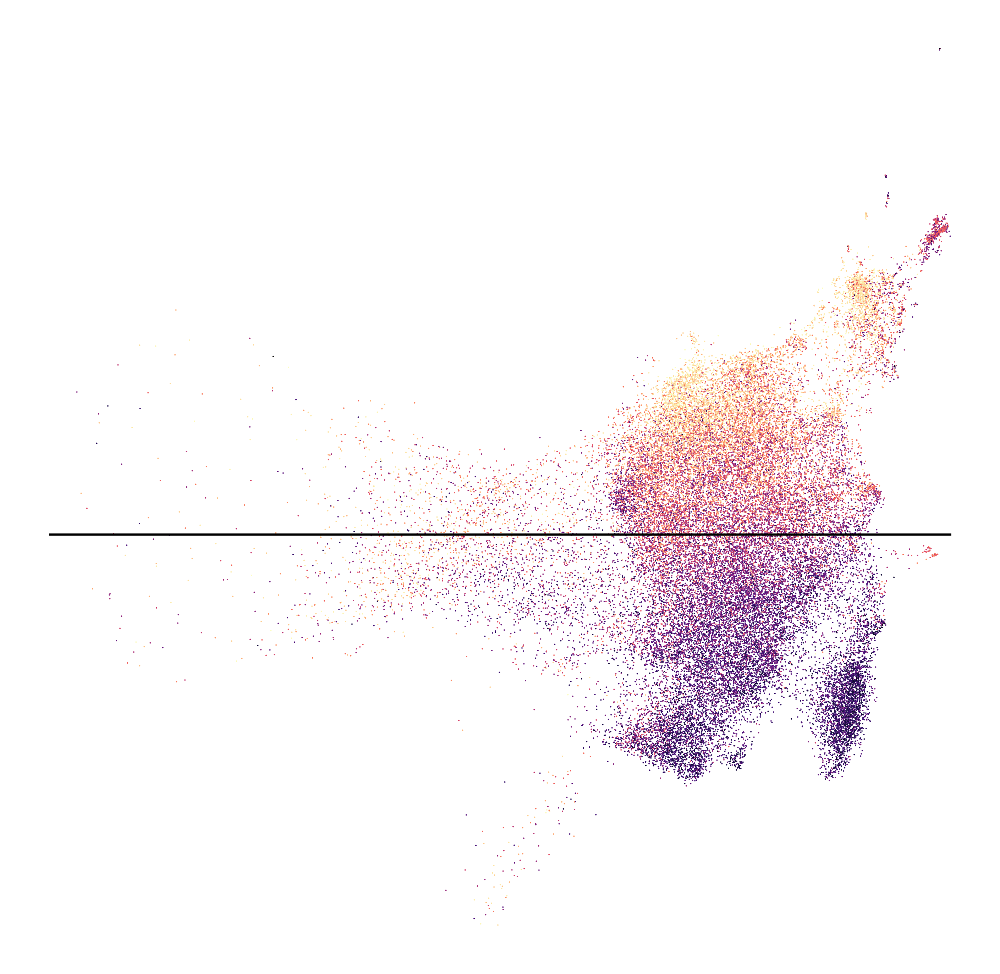

In [29]:
#Note that the colormap is slightly different than used in the paper
plt.figure(figsize=(25,25)) 

sc = plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1][bools==1],
            umap_nonsense_embedding[:,1][labels_all==1][bools==1],c=concs,cmap='magma',s=1)

plt.plot(np.linspace(np.min(-1.*umap_nonsense_embedding[:,0]),np.max(-1.*umap_nonsense_embedding[:,0]),10),
        np.ones(10)*np.median(umap_nonsense_embedding[:,1]),c='k',lw=3,label='Information Axis')

plt.axis('off')
plt.show()

### Figure 5

In [36]:
garbleness_all = []

for i in range(len(garble)):
    garbleness_all.append(np.log(garble[i][-1]))
    
garbleness_all = np.array(garbleness_all)
ind = ~np.isnan(garbleness_all)
garbleness_all = (garbleness_all-np.min(garbleness_all[ind]))/(np.max(garbleness_all[ind])-np.min(garbleness_all[ind]))

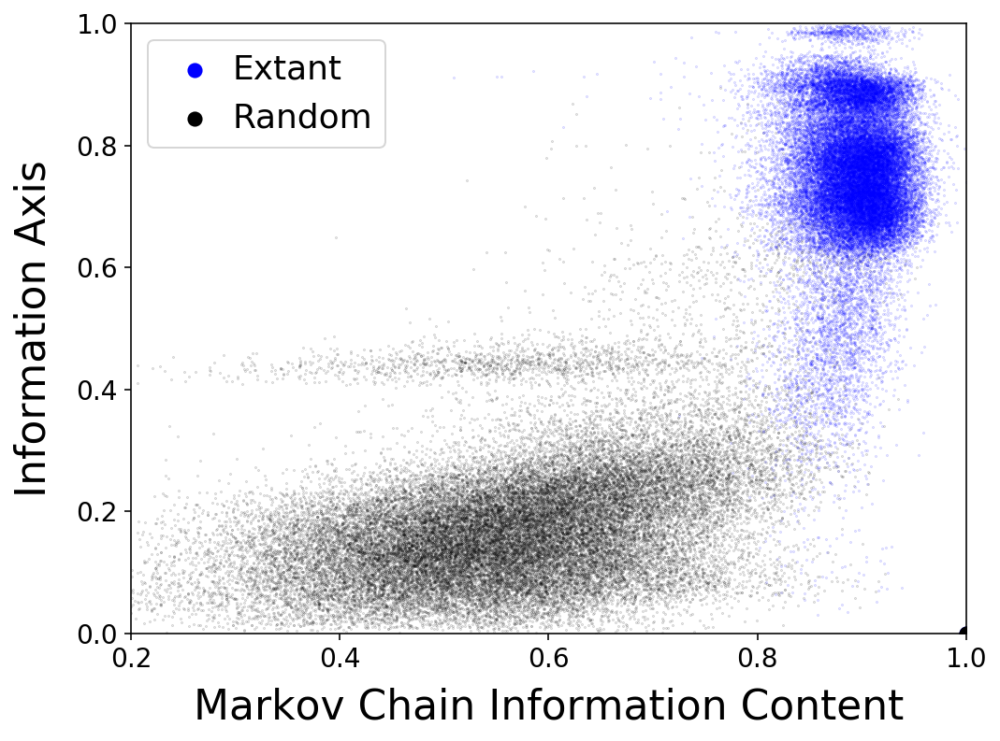

In [37]:
plt.figure(figsize=(8,6))

plt.scatter(1.-garbleness_all[0:39913],1.-garble_axis[labels_all==0],s=0.1,alpha=0.25,c='k')
plt.scatter(1.-garbleness_all[39913:],1.-garble_axis[labels_all==1],s=0.1,alpha=0.25,c='b')

plt.xlim(0.2,1.0)
plt.ylim(0,1)

plt.scatter(1.0,0,marker='o',c='b',s=50,label='Extant')
plt.scatter(1.0,0,marker='o',c='k',s=50,label='Random')

plt.legend(loc=2,fontsize=18,frameon=True,handletextpad=0.1)

plt.xticks([0.2,0.4,0.6,0.8,1.0],fontsize=14)
plt.yticks([0,0.2,0.4,0.6,0.8,1.0],fontsize=14)

plt.xlabel(r'Markov Chain Information Content',fontsize=22,labelpad=8)
plt.ylabel(r'Information Axis',fontsize=22,labelpad=12)
plt.show()

/Users/eon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/eon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  after removing the cwd from sys.path.
/Users/eon/miniconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/eon/miniconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Users/eon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The 'normed' kwarg 

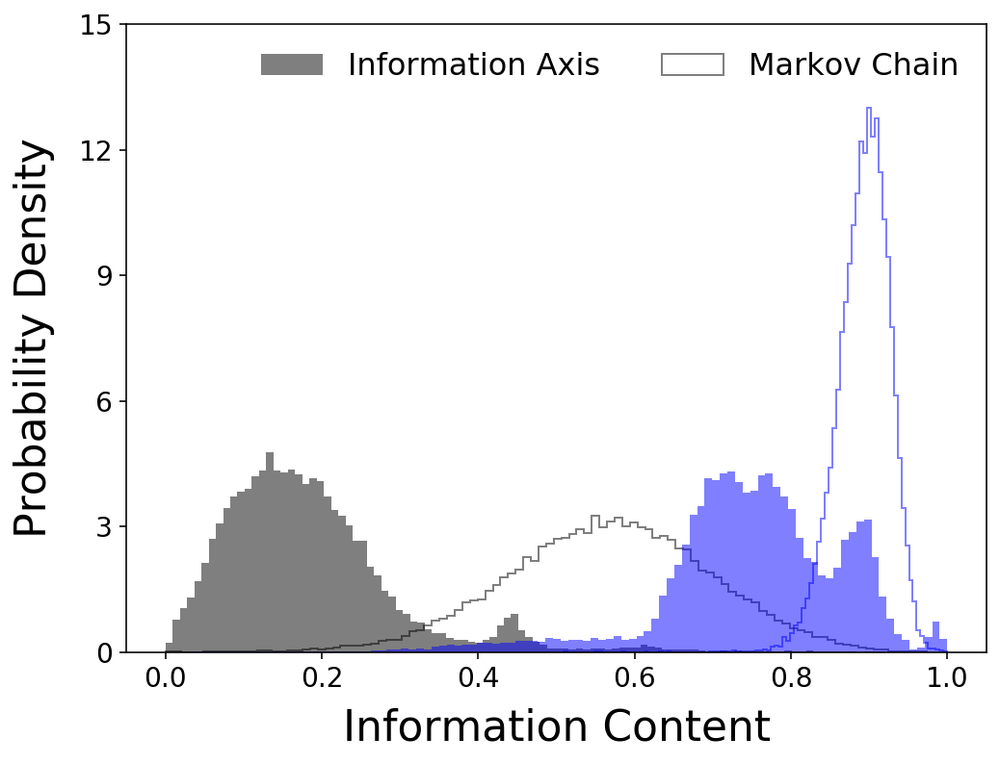

In [38]:
plt.figure(figsize=(8,6))

plt.hist(1.-garble_axis[labels_all==0],histtype='stepfilled',bins=100,alpha=0.5,color='k',normed=True,label='Information Axis')
plt.hist(1.-garbleness_all[0:39913],histtype='step',bins=100,alpha=0.5,color='k',normed=True,label='Markov Chain')
plt.hist(1.-garble_axis[labels_all==1],histtype='stepfilled',bins=100,alpha=0.5,color='b',normed=True)
plt.hist(1.-garbleness_all[39913:],histtype='step',bins=100,alpha=0.5,color='b',normed=True)

plt.xticks([0,0.2,0.4,0.6,0.8,1.0],fontsize=14)
plt.yticks([0,3,6,9,12,15],fontsize=14)

plt.legend(loc=1,fontsize=16,ncol=3,frameon=False)
plt.xlabel(r'Information Content',fontsize=22,labelpad=8)
plt.ylabel(r'Probability Density',fontsize=22,labelpad=12)

plt.show()

### Figure 6

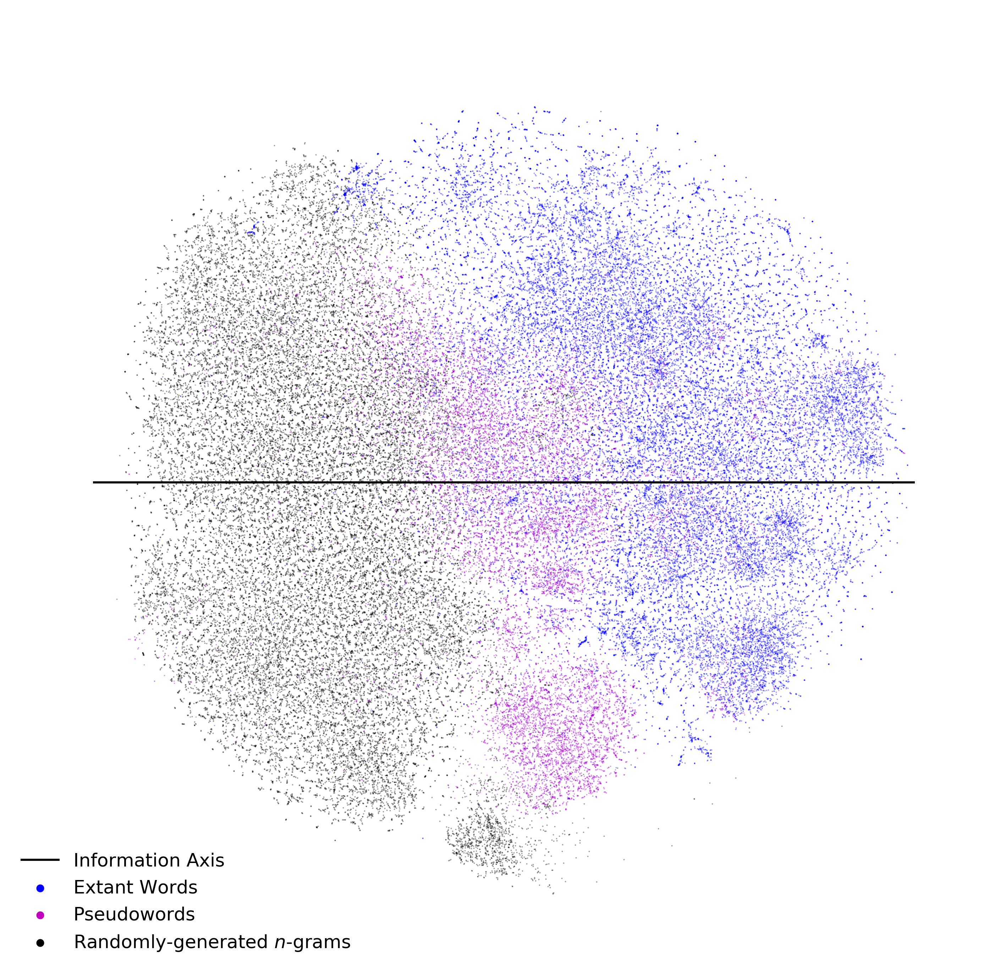

In [40]:
plt.figure(figsize=(25,25)) 

plt.scatter(-1.*tsne[:,0][0:39913]*np.sqrt(2)/2.-np.sqrt(2)/2.*tsne[:,1][0:39913],
            -tsne[:,0][0:39913]*np.sqrt(2)/2.+tsne[:,1][0:39913],
            s=1,marker='o',edgecolor='k',alpha=0.3,facecolor='k')

plt.scatter(-1.*tsne[:,0][39913:59289]*np.sqrt(2)/2.-np.sqrt(2)/2.*tsne[:,1][39913:59289],
            -1.*tsne[:,0][39913:59289]*np.sqrt(2)/2.+np.sqrt(2)/2.*tsne[:,1][39913:59289],
            s=1,marker='o',edgecolor='m',alpha=0.3,facecolor='b')

plt.scatter(-1.*tsne[:,0][59289:]*np.sqrt(2)/2.-np.sqrt(2)/2.*tsne[:,1][59289:],
            -tsne[:,0][59289:]*np.sqrt(2)/2.+np.sqrt(2)/2.*tsne[:,1][59289:],
            s=1,marker='o',edgecolor='b',alpha=0.3,facecolor='b')

plt.plot(np.linspace(np.min(-1.*tsne[:,0]),np.max(-1.*tsne[:,0]),10),
        np.ones(10)*np.median(tsne[:,1]),c='k',lw=3,label='Information Axis')

plt.scatter(99.,99.,marker='o',c='b',s=100,label='Extant Words')
plt.scatter(99.,99.,marker='o',c='m',s=100,label='Pseudowords')
plt.scatter(99.,99.,marker='o',c='k',s=100,label='Randomly-generated $n$-grams')

plt.legend(loc=3,fontsize=26,frameon=False)

plt.xlim(-70,70)
plt.ylim(-70,70)
plt.axis('off')

plt.show()

### Figure 7

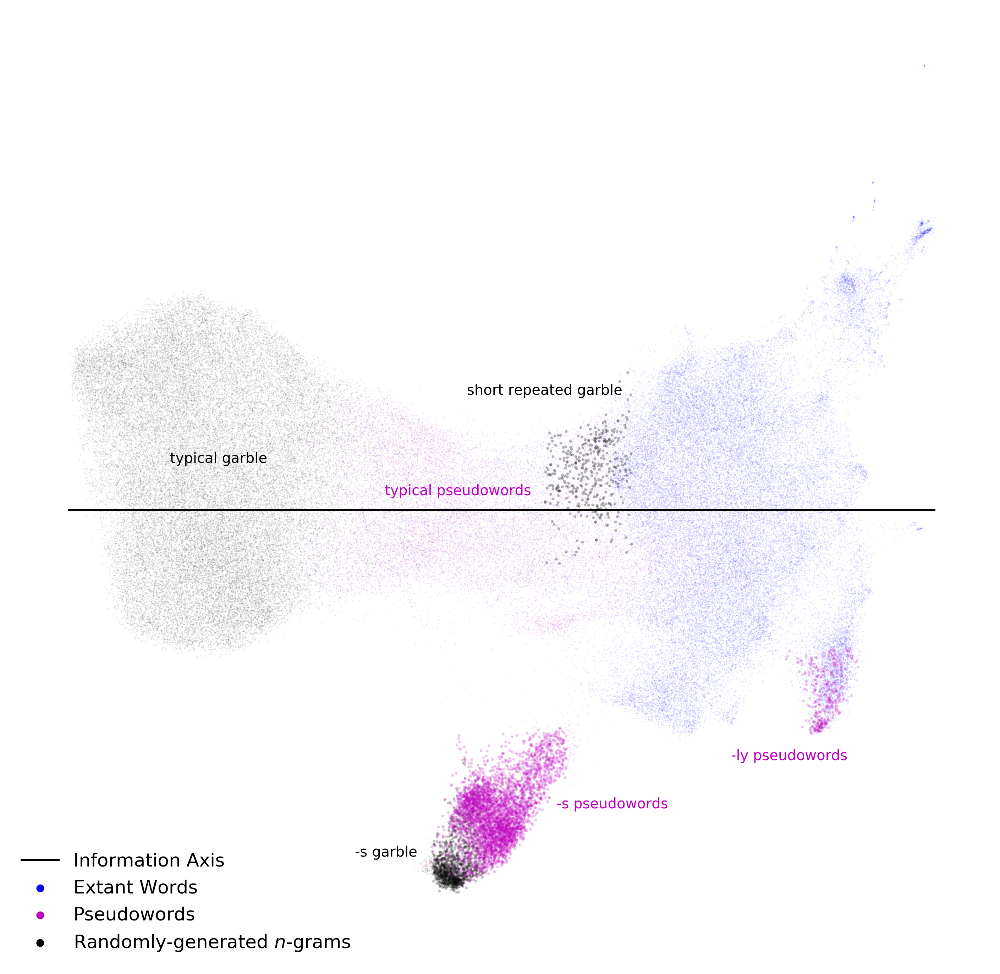

In [41]:
plt.figure(figsize=(25,25)) 

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==0],umap_nonsense_embedding[:,1][labels_all==0],
            s=1,marker='o',edgecolor='k',alpha=0.075,facecolor='k')


plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==1],umap_nonsense_embedding[:,1][labels_all==1],
            s=1,marker='o',edgecolor='b',alpha=0.075,facecolor='b')

plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==2],umap_nonsense_embedding[:,1][labels_all==2],
            s=1,marker='o',edgecolor='m',alpha=0.075,facecolor='m')

ind = np.logical_and(umap_nonsense_embedding[:,1][labels_all==0]<-3,np.logical_and((1-garble_axis[labels_all==0]<0.48),(1-garble_axis[labels_all==0]>0.42)))
plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==0][ind],
           umap_nonsense_embedding[:,1][labels_all==0][ind],c='k',alpha=0.15,s=10)

ind = np.logical_and(umap_nonsense_embedding[:,1][labels_all==0]>-1,np.logical_and((1-garble_axis[labels_all==0]<0.65),(1-garble_axis[labels_all==0]>0.55)))
plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==0][ind],
           umap_nonsense_embedding[:,1][labels_all==0][ind],c='k',alpha=0.2,s=10)

ind = np.logical_and(umap_nonsense_embedding[:,1][labels_all==2]<-3,np.logical_and((1-garble_axis[labels_all==2]<0.575),(1-garble_axis[labels_all==2]>0.4)))
plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==2][ind],
           umap_nonsense_embedding[:,1][labels_all==2][ind],c='m',alpha=0.15,s=10)

ind = np.logical_and(umap_nonsense_embedding[:,1][labels_all==2]<-2,np.logical_and((1-garble_axis[labels_all==2]<1),(1-garble_axis[labels_all==2]>0.8)))
plt.scatter(-1.*umap_nonsense_embedding[:,0][labels_all==2][ind],
           umap_nonsense_embedding[:,1][labels_all==2][ind],c='m',alpha=0.15,s=10)

plt.plot(np.linspace(np.min(-1.*umap_nonsense_embedding[:,0]),np.max(-1.*umap_nonsense_embedding[:,0]),10),
        np.ones(10)*np.median(umap_nonsense_embedding[:,1]),c='k',lw=3,label='Information Axis')

plt.scatter(99.,99.,marker='o',c='b',s=100,label='Extant Words')
plt.scatter(99.,99.,marker='o',c='m',s=100,label='Pseudowords')
plt.scatter(99.,99.,marker='o',c='k',s=100,label='Randomly-generated $n$-grams')

plt.legend(loc=3,fontsize=26,frameon=False)
plt.xlim(-13,2)
plt.ylim(-6,6)

plt.text(-10.5,0.3,'typical garble',fontsize=20)
plt.text(-6,1.15,'short repeated garble',fontsize=20,c='k')
plt.text(-7.7,-4.6,'-s garble',fontsize=20,c='k')
plt.text(-7.25,-0.1,'typical pseudowords',fontsize=20,c='m')
plt.text(-4.65,-4,'-s pseudowords',fontsize=20,c='m')
plt.text(-2,-3.4,'-ly pseudowords',fontsize=20,c='m')

plt.axis('off')
plt.show()